<a href="https://colab.research.google.com/github/Chandrashekar0123/Deep_Learning/blob/Transfer_Learning/Transfer_VGGDone.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


The Oxford Flowers 102 dataset is a popular image dataset used for flower classification. It contains 102 different flower categories, with each category having between 40 to 258 images. The images in the dataset are high-resolution, featuring various flower species that appear in a wide variety of backgrounds, lighting conditions, and orientations.
Number of Classes: 102 flower categories
Number of Images: Approximately 8,189 images in total
Each category has between 40 and 258 images, making it a balanced dataset for classification tasks.

##Importing the necessary libraries

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
import tensorflow_datasets as tfds
import tensorflow as tf

##Loading the dataset

In [ ]:
import tensorflow_datasets as tfds
import tensorflow as tf

# Load Oxford Flowers 102 dataset
dataset, info = tfds.load('oxford_flowers102', as_supervised=True, with_info=True)

# Unpack dataset splits
train_ds = dataset['train']
val_ds = dataset['validation']
test_ds = dataset['test']

# Normalize the pixel values to [0, 1] and resize images
def preprocess(image, label):
    image = tf.image.resize(image, (224, 224))  # Resize to 224x224
    image = tf.cast(image, tf.float32) / 255.0  # Normalize pixel values
    return image, label

train_ds = train_ds.map(preprocess).batch(32).prefetch(tf.data.experimental.AUTOTUNE)
val_ds = val_ds.map(preprocess).batch(32).prefetch(tf.data.experimental.AUTOTUNE)
test_ds = test_ds.map(preprocess).batch(32).prefetch(tf.data.experimental.AUTOTUNE)

# Print class names
print(f"Classes: {info.features['label'].names}")  # 102 flower class names


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

##Building the Model
##Tranfer Learning Using VGG16

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout

# Load the pre-trained VGG16 model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False  # Freeze the base model

# Add custom layers on top
model = Sequential([
    base_model,
    Flatten(),
    Dense(1024, activation='relu'),
    Dropout(0.5),
    Dense(102, activation='softmax')  # 102 classes for Oxford Flowers
])

# Show model summary
model.summary()


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)                   │ (None, 7, 7, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1024)                │      25,691,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 102)                 │         104,550 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 40,510,374 (154.53 MB)

 Trainable params: 25,795,686 (98.40 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

##Compiling the Model

In [ ]:

# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

##Training the Model

In [ ]:
# Train the model
history = model.fit(
    train_ds,
    epochs=50,
    validation_data=val_ds
)


Epoch 1/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 47s 899ms/step - accuracy: 0.0147 - loss: 7.9339 - val_accuracy: 0.0441 - val_loss: 4.4589
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 49s 305ms/step - accuracy: 0.0960 - loss: 4.1711 - val_accuracy: 0.1245 - val_loss: 4.1349
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 246ms/step - accuracy: 0.1482 - loss: 3.7304 - val_accuracy: 0.1931 - val_loss: 3.7929
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 10s 245ms/step - accuracy: 0.2851 - loss: 3.1684 - val_accuracy: 0.2431 - val_loss: 3.4074
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 292ms/step - accuracy: 0.3412 - loss: 2.6449 - val_accuracy: 0.3333 - val_loss: 3.1819
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 251ms/step - accuracy: 0.4309 - loss: 2.2763 - val_accuracy: 0.3422 - val_loss: 2.8427
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 248ms/step - accuracy: 0.5174 - loss: 1.9898 - val_accuracy: 0.4059 - val_loss: 2.6562
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - accuracy: 0.6084 - loss: 1.5460 - val_accuracy

In [ ]:
'''history = model.fit(
    train_ds,
    epochs=5,
    validation_data=val_ds
)'''

Epoch 1/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 288ms/step - accuracy: 0.7033 - loss: 1.1036 - val_accuracy: 0.4461 - val_loss: 2.2394
Epoch 2/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 290ms/step - accuracy: 0.7154 - loss: 1.0188 - val_accuracy: 0.4441 - val_loss: 2.2341
Epoch 3/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 260ms/step - accuracy: 0.7616 - loss: 0.9160 - val_accuracy: 0.4627 - val_loss: 2.1819
Epoch 4/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 291ms/step - accuracy: 0.7730 - loss: 0.8668 - val_accuracy: 0.5039 - val_loss: 2.0474
Epoch 5/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 298ms/step - accuracy: 0.7813 - loss: 0.7801 - val_accuracy: 0.4667 - val_loss: 2.0386


In [ ]:
'''history = model.fit(
    train_ds,
    epochs=10,
    validation_data=val_ds
)'''

Epoch 1/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 276ms/step - accuracy: 0.8281 - loss: 0.6326 - val_accuracy: 0.4990 - val_loss: 1.9834
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 10s 285ms/step - accuracy: 0.7934 - loss: 0.6724 - val_accuracy: 0.4853 - val_loss: 2.0271
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 289ms/step - accuracy: 0.8380 - loss: 0.5655 - val_accuracy: 0.4912 - val_loss: 1.9761
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 11s 309ms/step - accuracy: 0.8393 - loss: 0.5917 - val_accuracy: 0.5176 - val_loss: 1.9216
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 281ms/step - accuracy: 0.8362 - loss: 0.5557 - val_accuracy: 0.5088 - val_loss: 1.9418
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 282ms/step - accuracy: 0.8774 - loss: 0.4512 - val_accuracy: 0.5167 - val_loss: 1.9104
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 276ms/step - accuracy: 0.8833 - loss: 0.4091 - val_accuracy: 0.5304 - val_loss: 1.9148
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 10s 271ms/step - accuracy: 0.9052 - loss: 0.3331 - val_accuracy:

##Evaluating the Metrics

In [ ]:
# Evaluate on test dataset
test_loss, test_accuracy = model.evaluate(test_ds)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")


193/193 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - accuracy: 0.4934 - loss: 2.0520
Test Loss: 2.023961305618286
Test Accuracy: 0.5017076134681702


##Making the Predictions

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


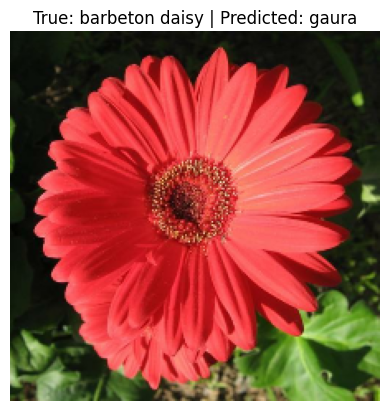

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Function to predict a single image
def classify_image(image, model, class_names):
    resized_image = tf.image.resize(image, (224, 224)) / 255.0  # Preprocess the image
    image_batch = tf.expand_dims(resized_image, axis=0)  # Add batch dimension
    predictions = model.predict(image_batch)  # Predict
    predicted_class = np.argmax(predictions[0])  # Get class index
    return class_names[predicted_class]

# Visualize prediction
for image, label in test_ds.unbatch().take(1):  # Take one image from the test set
    predicted_class = classify_image(image, model, info.features['label'].names)
    plt.imshow(image.numpy())
    plt.title(f"True: {info.features['label'].names[label]} | Predicted: {predicted_class}")
    plt.axis('off')
    plt.show()


##Plotting the Accuracy and Loss Graph

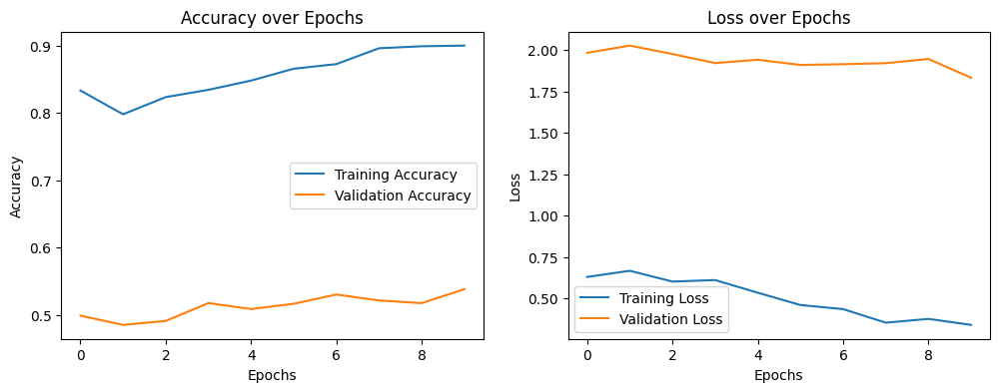

In [ ]:
# Plot accuracy and loss
plt.figure(figsize=(12, 4))

# Accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Accuracy over Epochs')

# Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss over Epochs')

plt.show()


#Making Predictions

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


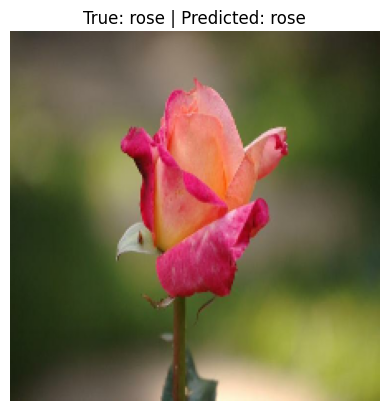

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

# Function to preprocess and predict for a single image
def predict_and_visualize(index, dataset, model, class_names):
    # Extract the image and label for the specified index
    for i, (image, label) in enumerate(dataset.unbatch()):
        if i == index:
            # Preprocess the image for prediction
            image_resized = tf.expand_dims(image, axis=0)  # Add batch dimension

            # Predict the class
            predictions = model.predict(image_resized)
            predicted_class = np.argmax(predictions[0])

            # Visualize the image and predictions
            plt.imshow(image.numpy())
            plt.title(f"True: {class_names[label.numpy()]} | Predicted: {class_names[predicted_class]}")
            plt.axis('off')
            plt.show()
            break

# Example usage
index_to_predict = 10  # Change to the desired index
predict_and_visualize(index_to_predict, test_ds, model, info.features['label'].names)


##Making preditions on all images in the datset

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


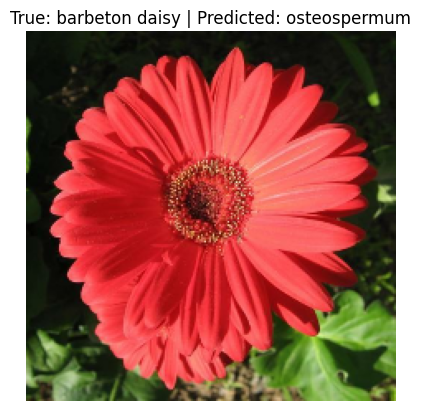

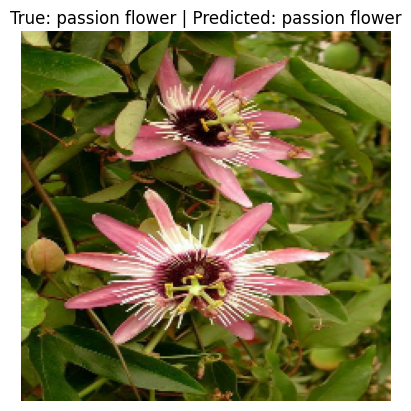

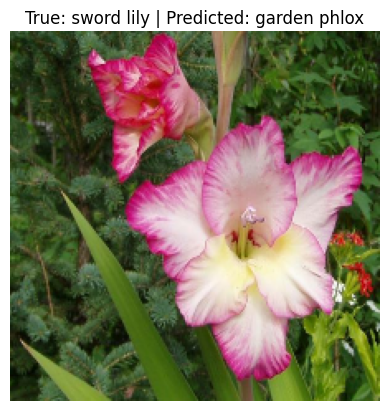

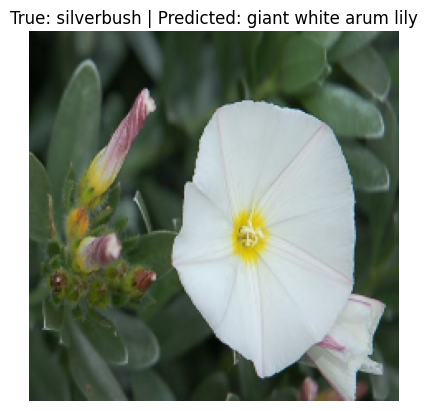

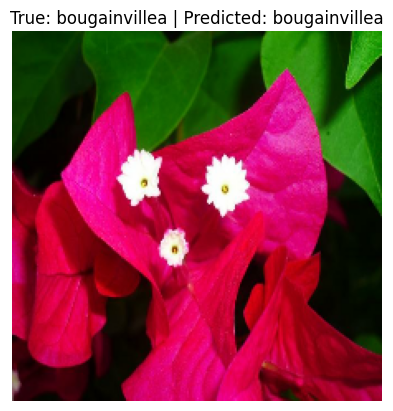

...

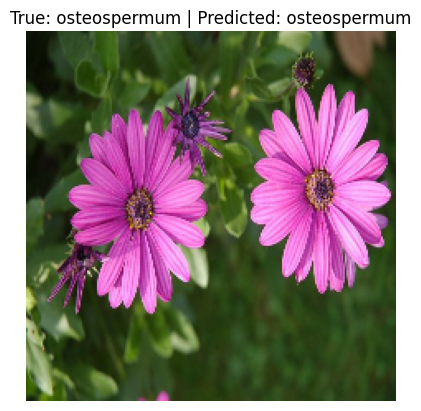

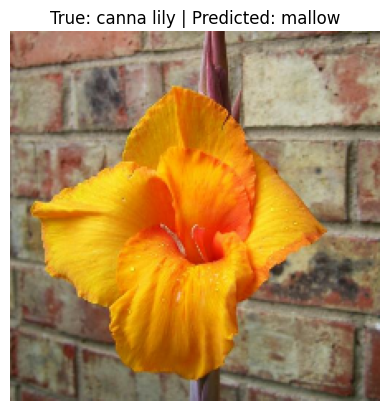

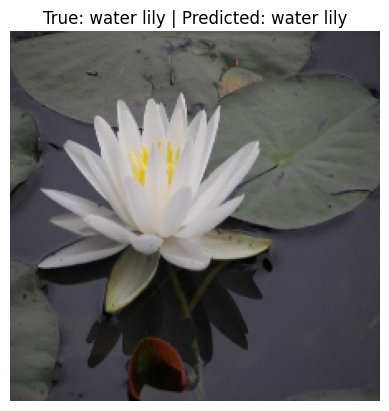

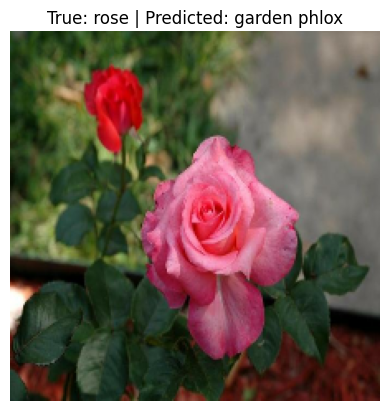

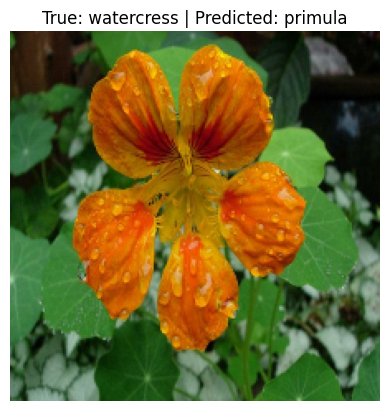

In [ ]:
# Predict for a batch of images
for images, labels in test_ds.take(1):  # Take the first batch
    predictions = model.predict(images)
    predicted_classes = np.argmax(predictions, axis=1)

    # Visualize predictions for the batch
    for i in range(len(images)):
        plt.imshow(images[i].numpy())
        plt.title(f"True: {info.features['label'].names[labels[i].numpy()]} | "
                  f"Predicted: {info.features['label'].names[predicted_classes[i]]}")
        plt.axis('off')
        plt.show()


##Predictions with desired index

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


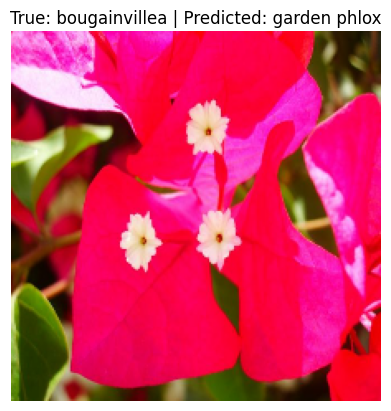

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

# Function to preprocess and predict a single image
def single_image_prediction(index, dataset, model, class_names):
    # Extract the indexed image and label from the dataset
    for i, (image, label) in enumerate(dataset.unbatch()):
        if i == index:
            # Preprocess the image
            image_resized = tf.expand_dims(image, axis=0)  # Add batch dimension

            # Predict the class
            predictions = model.predict(image_resized)
            predicted_class = np.argmax(predictions[0])

            # Display the image with the predicted label
            plt.imshow(image.numpy())
            plt.title(f"True: {class_names[label.numpy()]} | Predicted: {class_names[predicted_class]}")
            plt.axis('off')
            plt.show()
            break

# Example usage
index_to_visualize = 6  # Replace with your desired index
single_image_prediction(index_to_visualize, test_ds, model, info.features['label'].names)


##Output 1 (correct)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


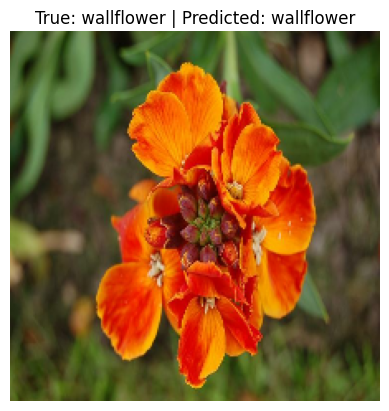

In [ ]:

# Example usage
index_to_visualize = 24 # Replace with your desired index
single_image_prediction(index_to_visualize, test_ds, model, info.features['label'].names)

##Output 2 (correct)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


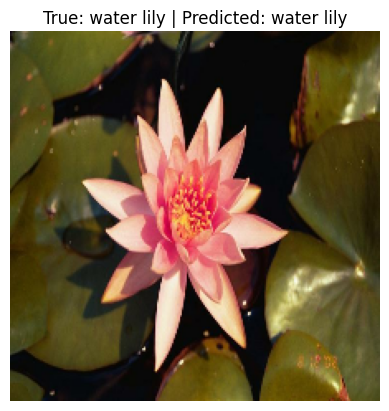

In [ ]:

# Example usage
index_to_visualize = 98  # Replace with your desired index
single_image_prediction(index_to_visualize, test_ds, model, info.features['label'].names)

##Output 3 (incorrect)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


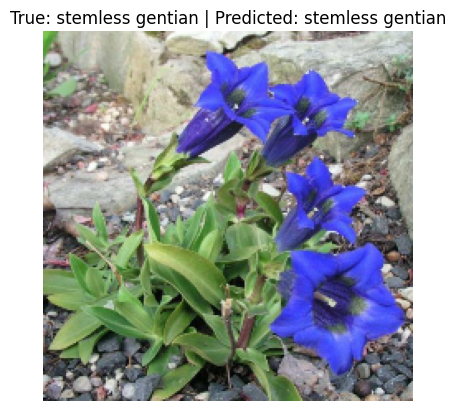

In [ ]:

# Example usage
index_to_visualize = 88  # Replace with your desired index
single_image_prediction(index_to_visualize, test_ds, model, info.features['label'].names)

##Output 4 (correct)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


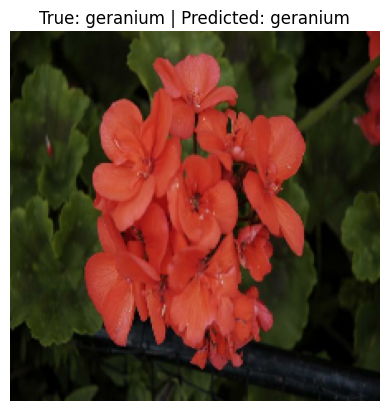

In [ ]:

# Example usage
index_to_visualize = 2947 # Replace with your desired index
single_image_prediction(index_to_visualize, test_ds, model, info.features['label'].names)